In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from math import *
import operator

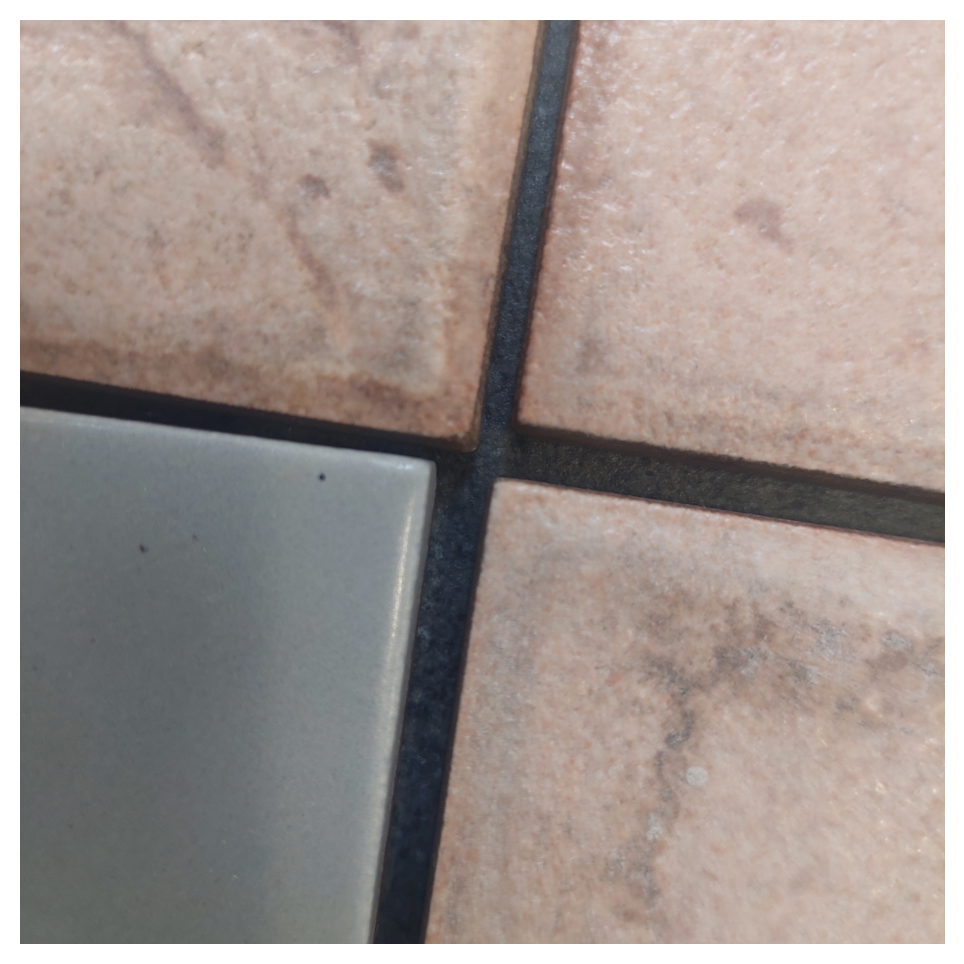

In [30]:
# input_img = cv2.imread('/home/gilad/dev_ws/camera_dev/images/march_31_3_Color.png')
#/home/gilad/dev_ws/camera_dev/images/20240403_170835.jpg
# input_img = cv2.imread('/home/gilad/dev_ws/camera_dev/images/20240403_170833.jpg')
# input_img = cv2.imread('/home/gilad/dev_ws/camera_dev/images/20240403_170835.jpg')
input_img = cv2.imread('/home/gilad/dev_ws/camera_dev/images/20240403_170839.jpg')
input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
# blur_img = cv2.GaussianBlur(input_img, (5, 5), 0)
gray_img = cv2.cvtColor(input_img, cv2.COLOR_RGB2GRAY)
canny_img = cv2.Canny(gray_img, 50, 150)

plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(input_img)
plt.axis('off')
plt.show()







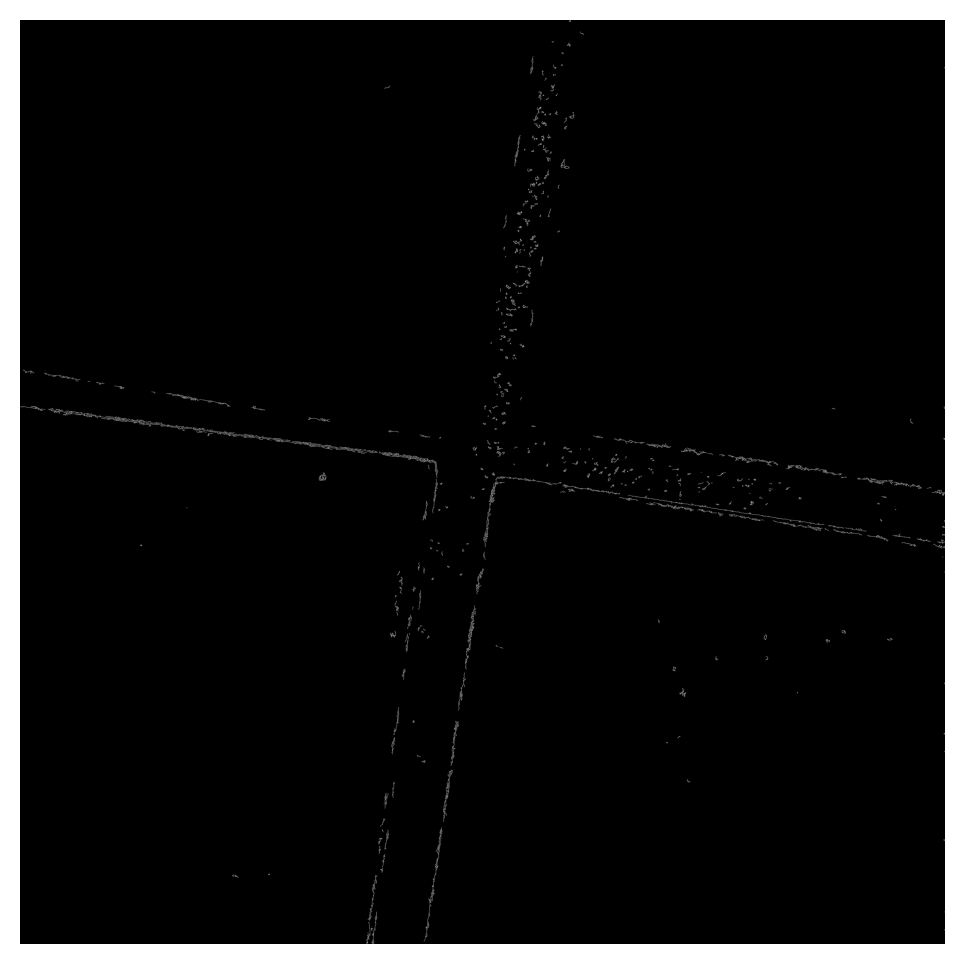

In [31]:
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(canny_img, cmap='gray')
plt.axis('off')
plt.show()


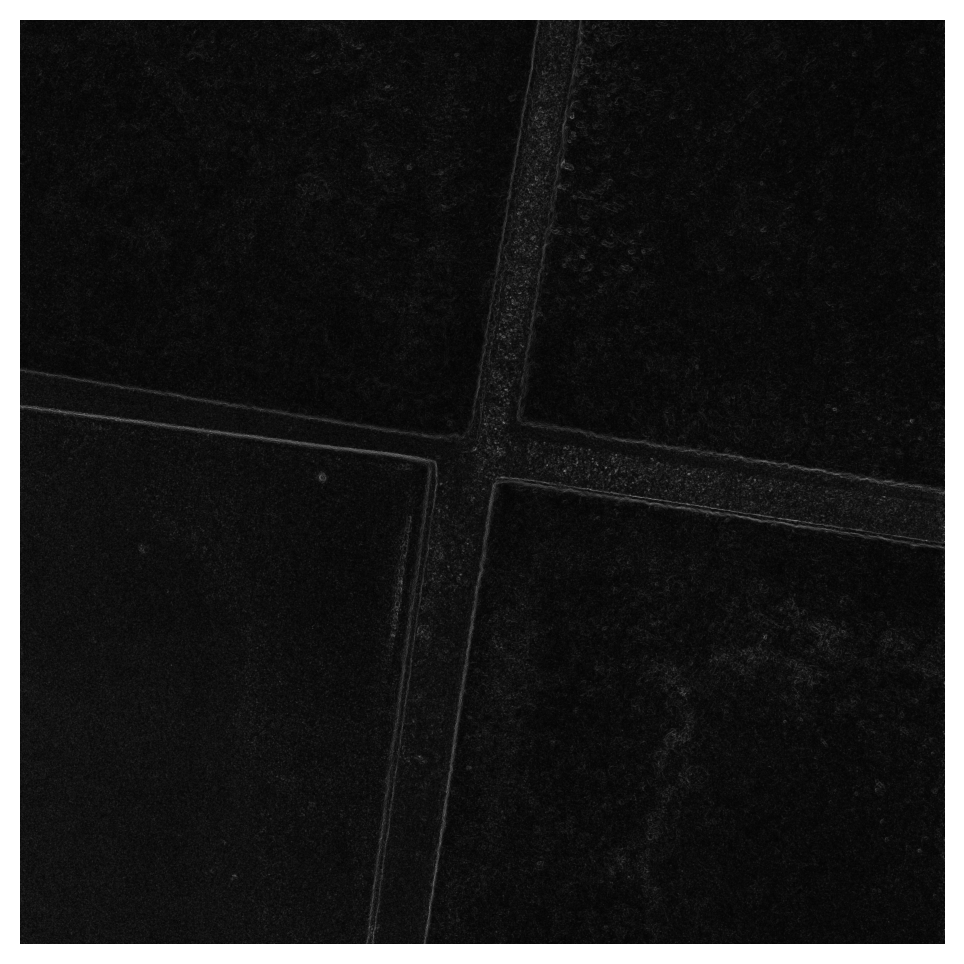

In [32]:


sx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=3)
sy = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=3)

sob = np.hypot(sx, sy)
sob = sob.astype(np.uint8)
# sob = cv2.cvtColor(sob, cv2.COLOR_RGB2GRAY)
plt.figure(figsize=(12, 6),dpi=200)    
plt.imshow(sob, cmap='gray')
plt.axis('off')
plt.show()

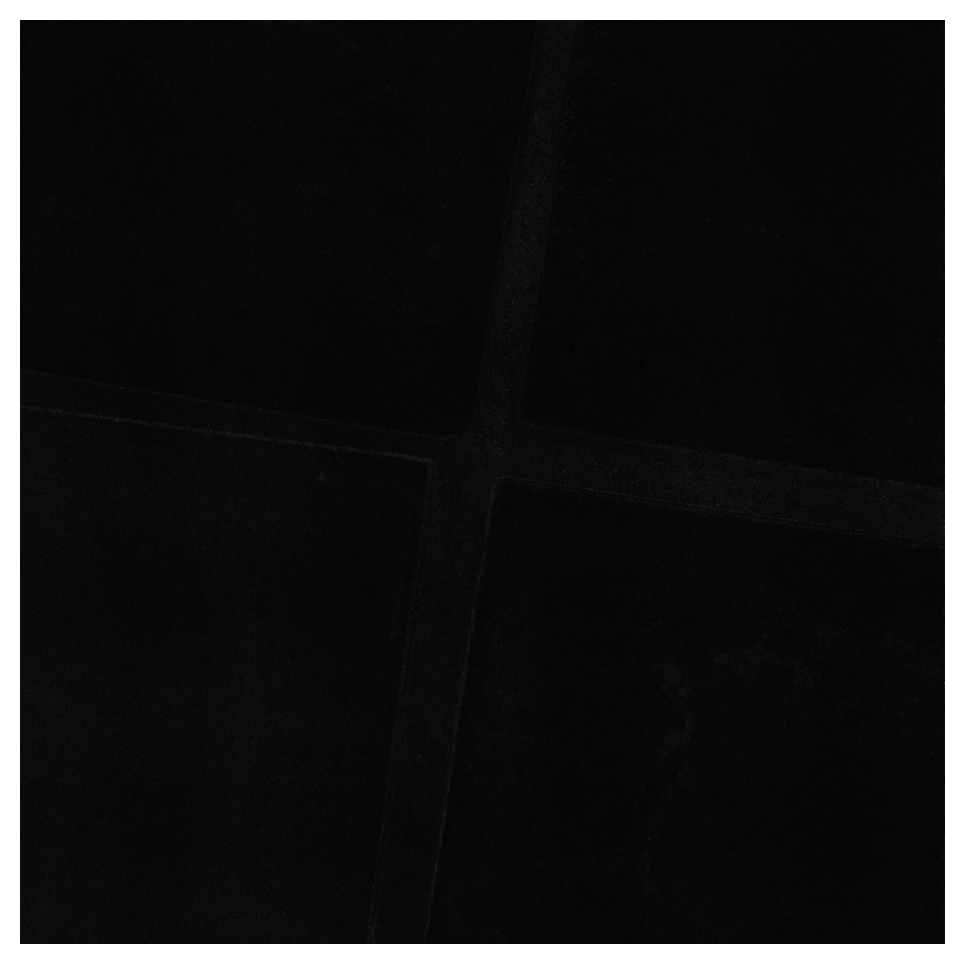

In [33]:
lap = cv2.Laplacian(gray_img, cv2.CV_64F)
lap = np.uint8(np.absolute(lap))
plt.figure(figsize=(12,6),dpi=200)
plt.imshow(lap, cmap='gray')
plt.axis('off')
plt.show()


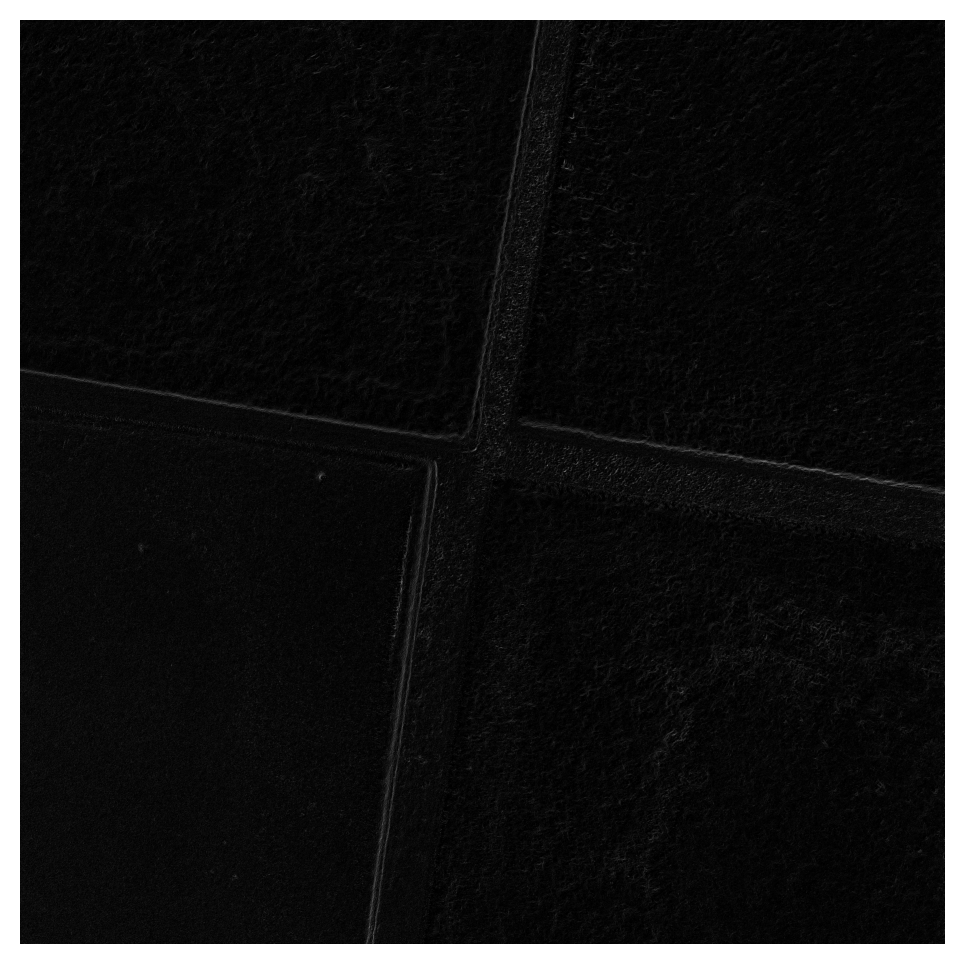

In [34]:
pew_pow = 1.5
pew_x = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]]) * pew_pow
pew_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]) * pew_pow
prewitx = cv2.filter2D(gray_img, -1, pew_x)
prewity = cv2.filter2D(gray_img, -1, pew_y)
prewit = np.hypot(prewitx, prewity)
# prewit = prewit.astype(np.uint8)

prewit[prewit < 5] = 0
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(prewit, cmap='gray')
plt.axis('off')
plt.show()

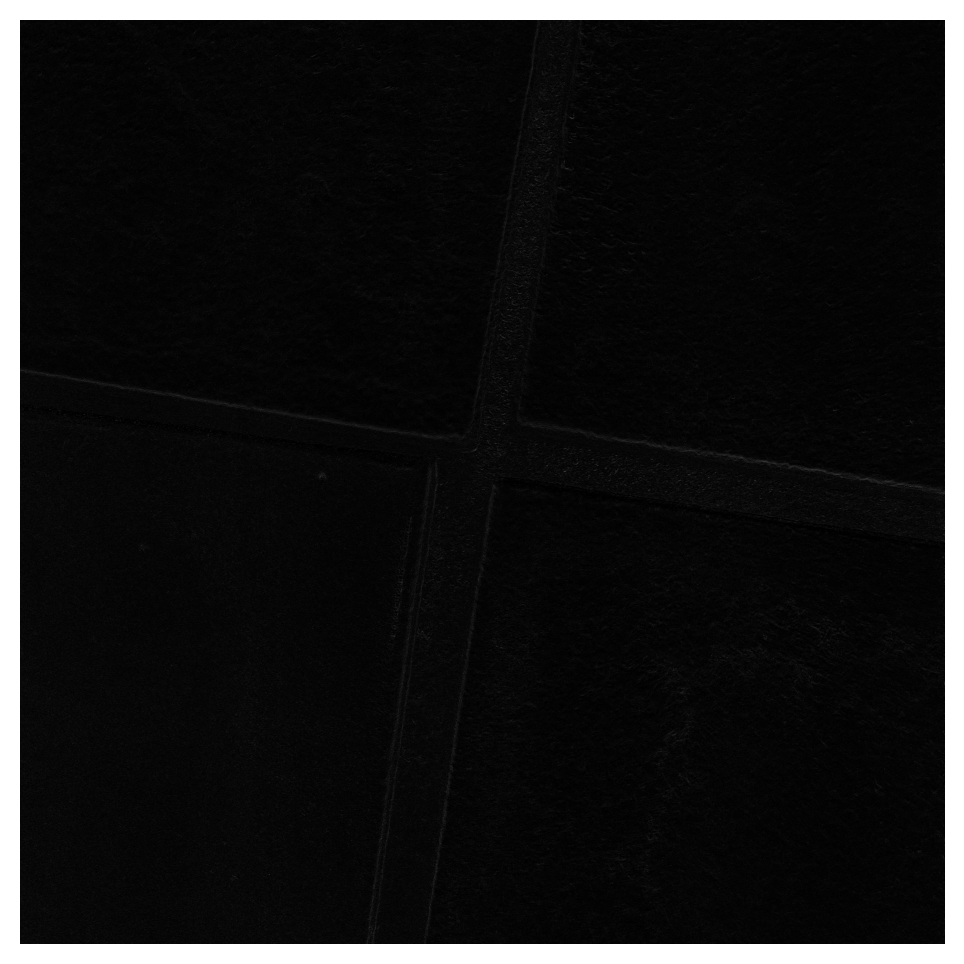

In [35]:
gx_c = np.array([[1,0],[0,-1]])
gy_c = np.array([[0,1],[-1,0]])
g_x = cv2.filter2D(gray_img, -1, gx_c)
g_y = cv2.filter2D(gray_img, -1, gy_c)
g = np.hypot(g_x, g_y)
roberts = g.astype(np.uint8)
# roberts[roberts < 250] = 0
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(g, cmap='gray')
plt.axis('off')
plt.show()


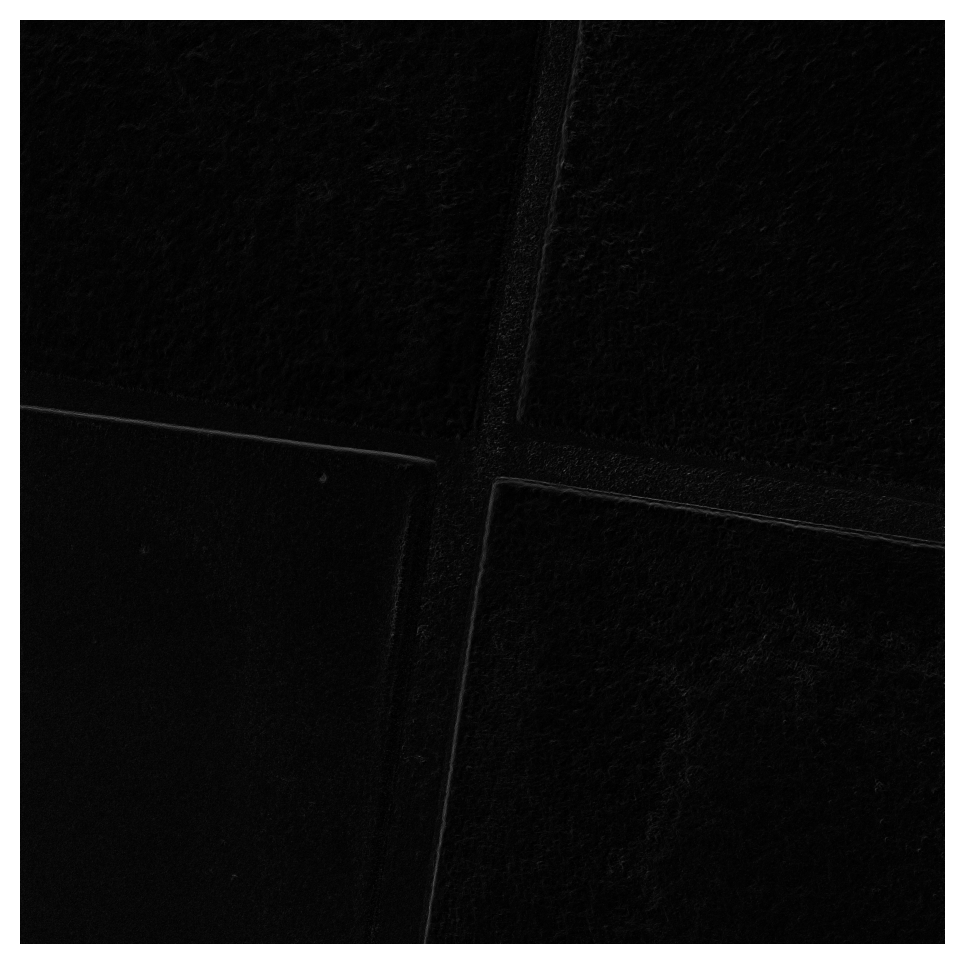

In [36]:
filter_scale = 0.5
horizontal = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]]).astype(np.float64)*filter_scale
vertical = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]).astype(np.float64)*filter_scale
sobel_x = cv2.filter2D(gray_img, -1, horizontal)
sobel_y = cv2.filter2D(gray_img, -1, vertical)
sobel = np.hypot(sobel_x, sobel_y)
sobel = sobel.astype(np.uint8)
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(sobel, cmap='gray')
plt.axis('off')
plt.show()

In [37]:
box_coords = [1382,0,1650,2580,0,2730,0,0]# for 20240403_170835.jpg
box_coords = [0,0,0,1410,1750,1680,2025,0]
box_coords = np.array(box_coords).reshape(-1, 2).astype(np.int32)
input_mask_img = prewit.copy()
mask = np.zeros_like(input_mask_img[:,:], dtype=np.uint8)
cv2.drawContours(mask, [box_coords], -1, (255), -1)
# plt.imshow(mask, cmap='gray')
masked_image_hold = cv2.bitwise_and(input_mask_img, input_mask_img, mask=mask)
mask_image_ground = cv2.bitwise_xor(input_mask_img, masked_image_hold)


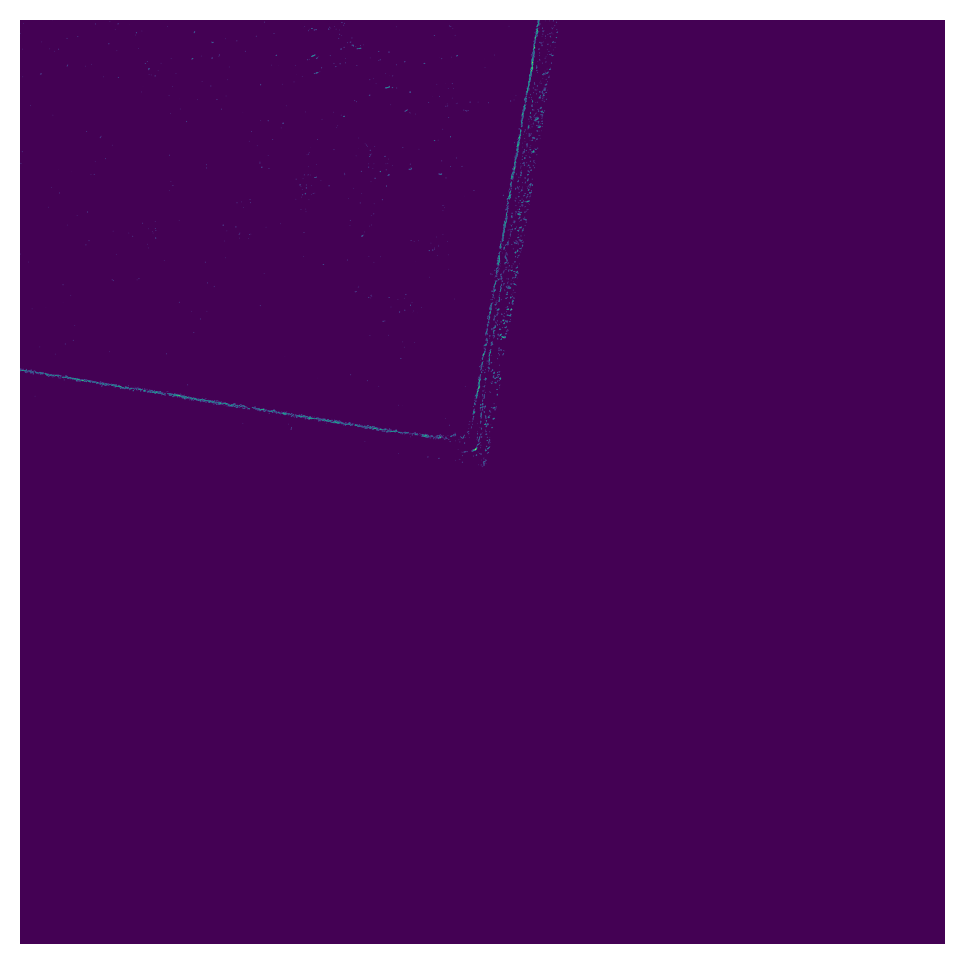

In [38]:
mask_t = 60
masked_image_hold[masked_image_hold < mask_t] = 0
masked_image_hold[masked_image_hold > mask_t] = 255
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(masked_image_hold)
plt.axis('off')
plt.show()

(3472, 3472, 3)
(3472, 3472, 3)


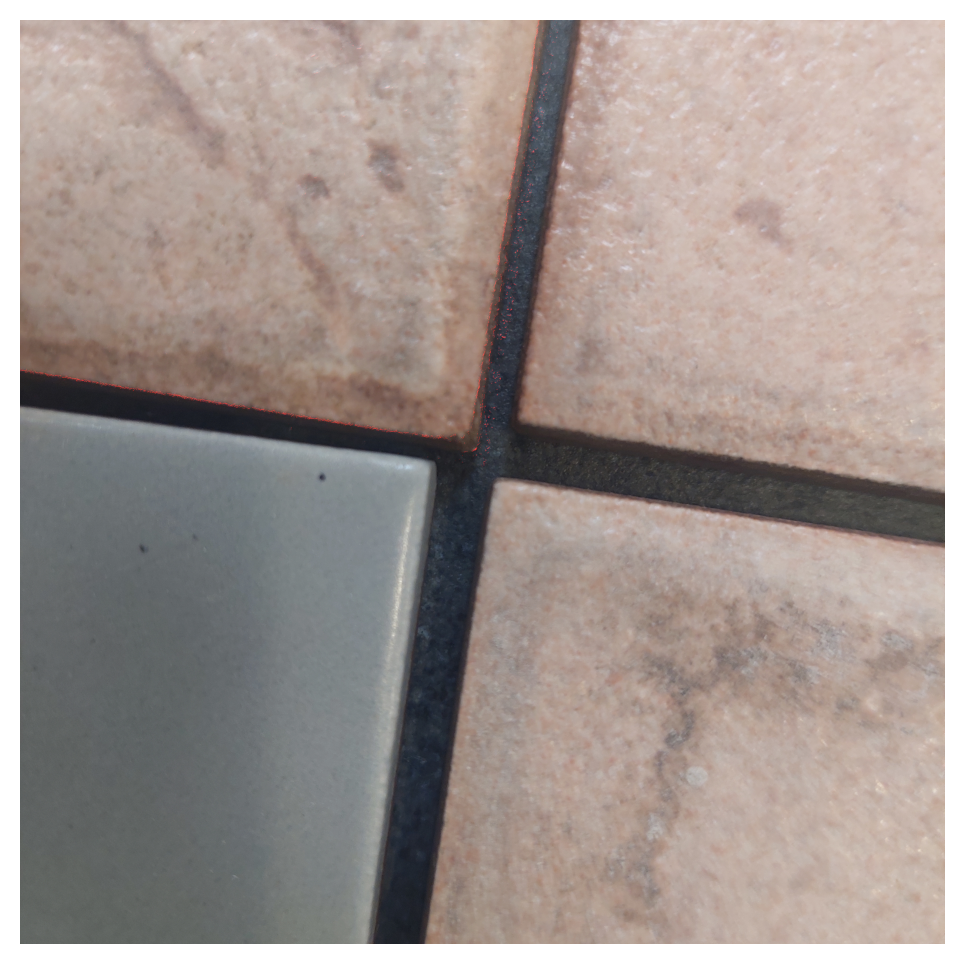

In [39]:
hold_mask_depth = masked_image_hold.copy()
hold_mask_depth[hold_mask_depth > 0] = 255
kernel = np.ones((7,7),np.uint8)
mn = hold_mask_depth.min()
mx = hold_mask_depth.max()

mx -= mn

hold_mask_depth =( ((hold_mask_depth - mn)/mx) * 255).astype(np.uint8)
dilation = cv2.dilate(hold_mask_depth,kernel,iterations = 100)

hold_mask_depth_3 = np.array(hold_mask_depth)
hold_mask_depth_3 = np.stack([hold_mask_depth_3,np.zeros_like(hold_mask_depth_3), np.zeros_like(hold_mask_depth_3)], axis=-1)
print(hold_mask_depth_3.shape)
print(input_img.shape)
added_img = cv2.bitwise_or(hold_mask_depth_3,input_img)
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(added_img)
plt.axis('off')
plt.show()

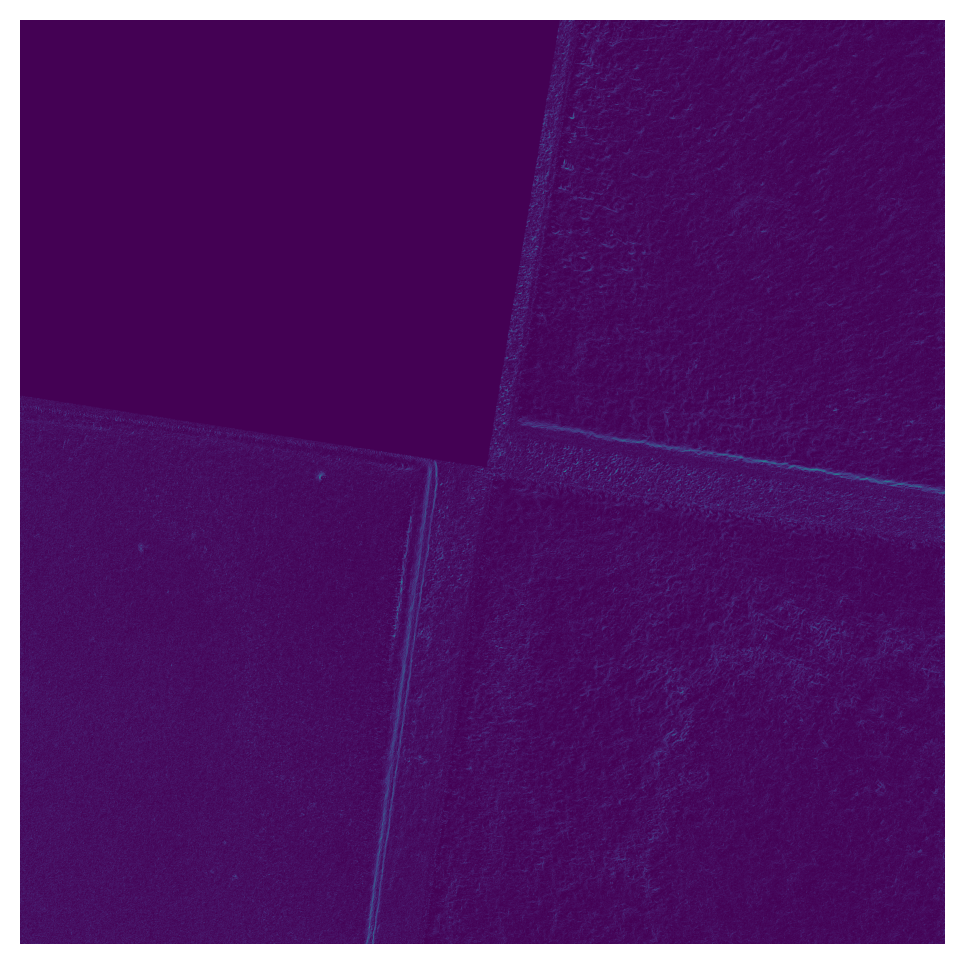

In [40]:
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(mask_image_ground)
plt.axis('off')
plt.show()

In [41]:
def elements(array):
    return array.ndim and array.size

In [42]:
block_size = 10 # block size 
canny_h, canny_w = masked_image_hold.shape # input image size
block_h = canny_h // block_size #num of blocks in height
block_w = canny_w // block_size #num of blocks in width
block = np.zeros((block_h, block_w, block_size, block_size)) # block matrix
# block_weight = np.zeros((block_size))#block weight array 
line_threshold = 0.3
lines = np.zeros((block_h, block_w))
# block divider
for i in range(block_h):
    for j in range(block_w):
        
        # block[i, j,:,:] = canny_img[i*block_size:(i+1)*block_size, j*block_size:(j+1)*block_size] # fill block matrix
        # block[i, j,:,:] = sob[i*block_size:(i+1)*block_size, j*block_size:(j+1)*block_size] # fill block matrix
        # block[i, j,:,:] = lap[i*block_size:(i+1)*block_size, j*block_size:(j+1)*block_size] # fill block matrix
        block[i, j,:,:] = masked_image_hold[i*block_size:(i+1)*block_size, j*block_size:(j+1)*block_size] # fill block matrix
        # block[i, j,:,:] = mask_image_ground[i*block_size:(i+1)*block_size, j*block_size:(j+1)*block_size] # fill block matrix

block_cov = np.zeros((block_h, block_w,2,2)) # covariance matrix for all blocks
# calculate covariance matrix for each block
for i in range(block_h):
    for j in range(block_w):
        x = np.argwhere(block[i, j,:,:] >100)

        block_weight = []
        for k in range(x.shape[0]):
            block_weight.append((block[i, j,x[k,0],x[k,1]]) ** 2  / sum((block[i, j,:,:].flatten()) ** 2))

        if len(x) < sqrt(2)*block_size or len(x) == 0:
            block_cov[i,j] = [[nan,nan],[nan,nan]]
        else:
            temp =  np.cov(x.T,aweights=block_weight)
            # assert(x.shape[0] == len(block_weight))
            cov_temp = temp 
            # print("cov_temp: ",cov_temp)
            if np.isnan(cov_temp).any():
                block_cov[i,j] = [[nan,nan],[nan,nan]]
                print("nan")
            else:
                block_cov[i,j] = cov_temp

                      


lines = np.zeros((block_h, block_w,2))

# calculate eigen values and eigen vectors for each block and sort them in descending order
for i in range(block_h):
    for j in range(block_w):
        if np.isnan(block_cov[i,j]).any():
            lines[i,j] = nan
            continue
        eig_val,eig_vec = np.linalg.eig(block_cov[i,j])
        idx = eig_val.argsort()[::-1]
        eig_val,eig_vec = eig_val[idx],eig_vec[:,idx]
        if eig_val[0]  == 0.0:  
            lines[i,j] = nan
        elif eig_val[1] / eig_val[0] < line_threshold:
            lines[i,j]  = eig_vec[0]/np.linalg.norm(eig_vec[0])
            # while atan2(lines[i,j,1],lines[i,j,0]) < 0:
            #     lines[i,j] = np.matmul([[-1,0],[0,-1]],lines[i,j])
        else:
            lines[i,j] = nan    
        




                



In [43]:



# recompose the image
output_image = input_img.copy()
canny_copy = masked_image_hold.copy()
for i in range(block_h):
    for j in range(block_w):
        if np.isnan(lines[i,j,0]) or np.isnan(lines[i,j,1]):
            continue
        center = (j*block_size + block_size//2, i*block_size + block_size//2)
        if elements(lines[i,j]):
            [x1,y1] = [int(center[0] - block_size*lines[i,j,1]), int(center[1] -block_size*lines[i,j,0])]
            [x2,y2] = [int(center[0] + block_size*lines[i,j,1]), int(center[1] + block_size*lines[i,j,0])]
            cv2.line(
                output_image, (x1, y1), (x2, y2),
                        (255,0,0), 5
                )
            cv2.line(
                canny_copy, (x1, y1), (x2, y2),
                        (255,0,0), 7
                )
            


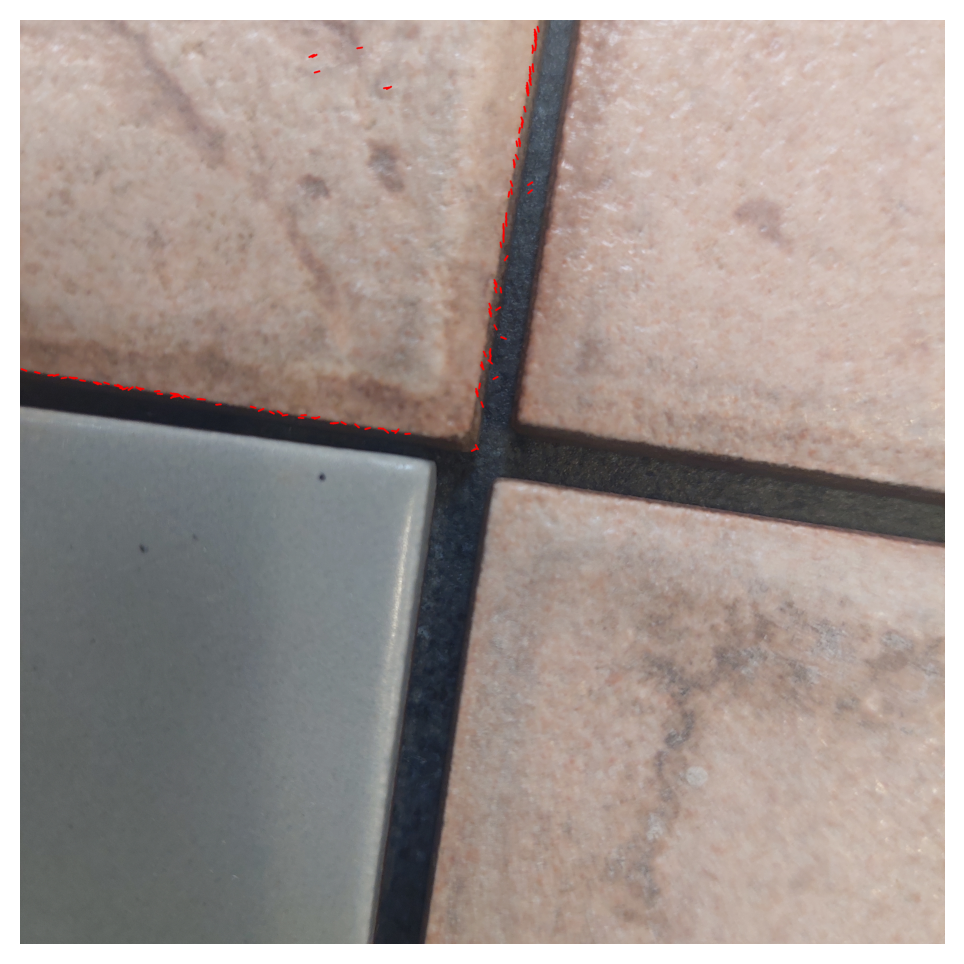

In [44]:
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(output_image)
plt.axis('off')
plt.show()

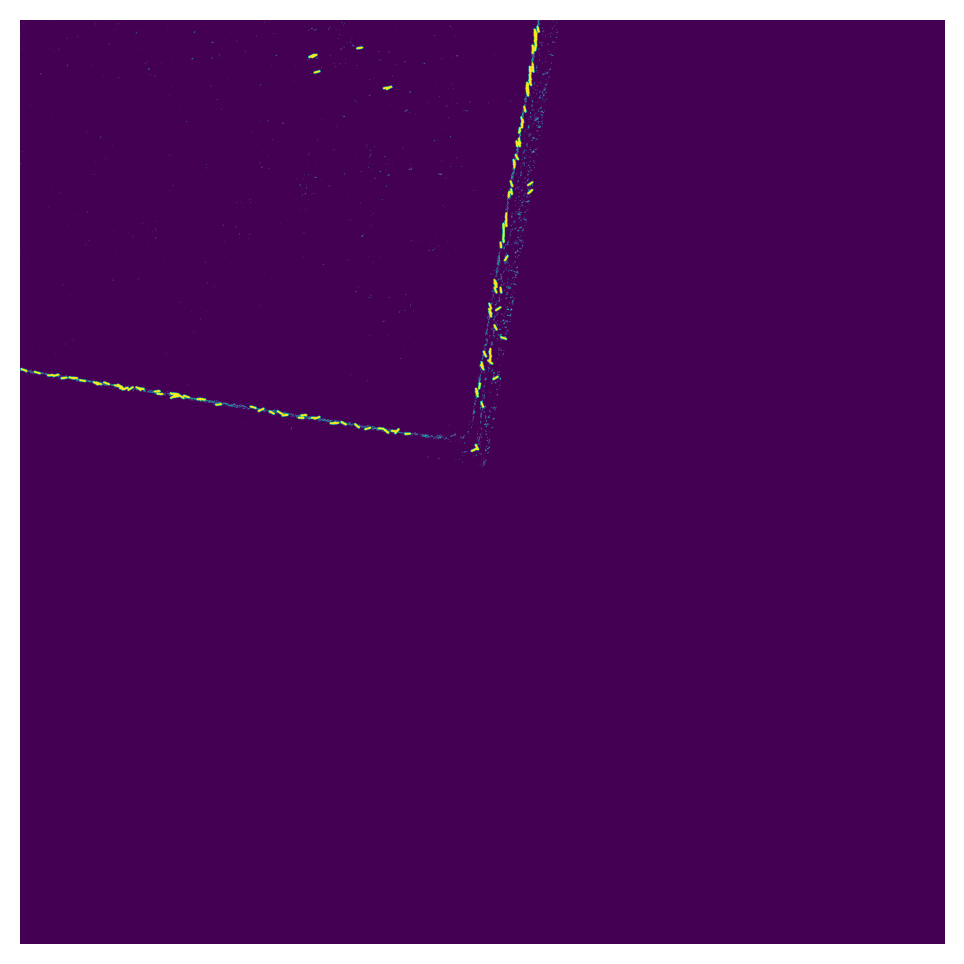

In [45]:
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(canny_copy)
plt.axis('off')
plt.show()


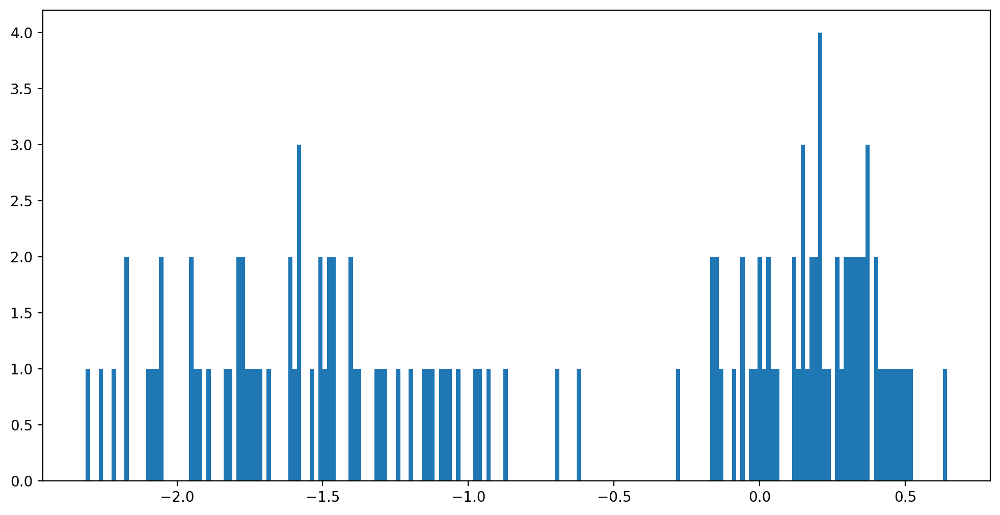

In [46]:

angle_lines = []
lines_to_hist = []
indx =[]

reshaped_lines = lines.reshape(-1,2)
reshaped_angles = np.arctan2(reshaped_lines[:,1],reshaped_lines[:,0])
reshaped_angles = reshaped_angles[~np.isnan(reshaped_angles)]
# print(reshaped_angles.shape)
# print(reshaped_angles)
for ind,line in enumerate(reshaped_angles):
    if  not np.isnan(line):
        if line > np.pi/2:
            line -= np.pi/2
        lines_to_hist.append(line)
        indx.append(ind)






plt.figure(figsize=(12, 6),dpi=200)
counts,bin,bars =  plt.hist(lines_to_hist, bins=200,)

# plot_max = max(counts)
# plot_max_idx = np.argmax(counts)
# plot_max_angle = bin[plot_max_idx]

# z = [x  for _,_,x in sorted(zip(counts,bin,bars),reverse=True)]

# for i,bar in enumerate(z):
    # print (i,bar)


# print(bars[40])

# print("max:",plot_max, "angle:",plot_max_angle, "idx:",plot_max_idx)
# print(counts)

plt.show()

    

centers before outliers removal [[-1.58921245]
 [ 0.17152213]]
centers_diff  [1.76073458] rad,  [100.88266016] deg
centers after outlier removal [[ 0.15976859]
 [-1.59579126]]
centers_diff  [-1.75555985] rad,  [-100.5861699] deg


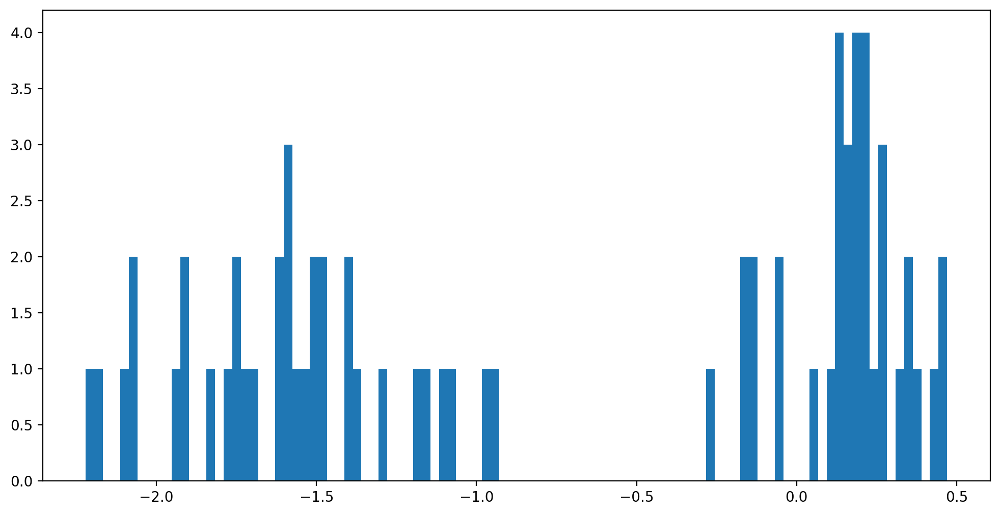

In [47]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2)
kmeans.fit(np.array(lines_to_hist).reshape(-1,1))
y_kmeans = kmeans.predict(np.array(lines_to_hist).reshape(-1,1))
centers = kmeans.cluster_centers_
print("centers before outliers removal",centers)
print("centers_diff ",centers[1]-centers[0],"rad, ",(centers[1]-centers[0])*180/pi,"deg")
for line in lines_to_hist:
    if min(abs(line - centers)) > 0.1:
        lines_to_hist.remove(line)


kmeans.fit(np.array(lines_to_hist).reshape(-1,1))
y_kmeans = kmeans.predict(np.array(lines_to_hist).reshape(-1,1))
centers = kmeans.cluster_centers_
print("centers after outlier removal",centers)
print("centers_diff ",centers[1]-centers[0],"rad, ",(centers[1]-centers[0])*180/pi,"deg")

plt.figure(figsize=(12, 6),dpi=200)
plt.hist(lines_to_hist, bins=100)  
plt.show()





In [48]:
ang1_lines = []
ang2_lines = []
ang1_img = np.zeros_like(masked_image_hold)
ang2_img = np.zeros_like(masked_image_hold)

for i in range(lines.shape[0]):
    for j in range(lines.shape[1]):
        if np.isnan(lines[i,j,0]) or np.isnan(lines[i,j,1]):
            continue
        center = (j*block_size + block_size//2, i*block_size + block_size//2)
        if elements(lines[i,j]):
            [x1,y1] = [int(center[0] - block_size*lines[i,j,1]), int(center[1] -block_size*lines[i,j,0])]
            [x2,y2] = [int(center[0] + block_size*lines[i,j,1]), int(center[1] + block_size*lines[i,j,0])]
            angle = atan2(lines[i,j,1],lines[i,j,0])
            if abs(angle - centers[0]) < abs(angle - centers[1]):
                ang1_lines.append(lines[i,j])
                cv2.line(
                    ang1_img, (x1, y1), (x2, y2),
                            (255,0,0), 5
                    )
            else:
                ang2_lines.append(lines[i,j])
                cv2.line(
                    ang2_img, (x1, y1), (x2, y2),
                            (255,0,0), 5
                    )






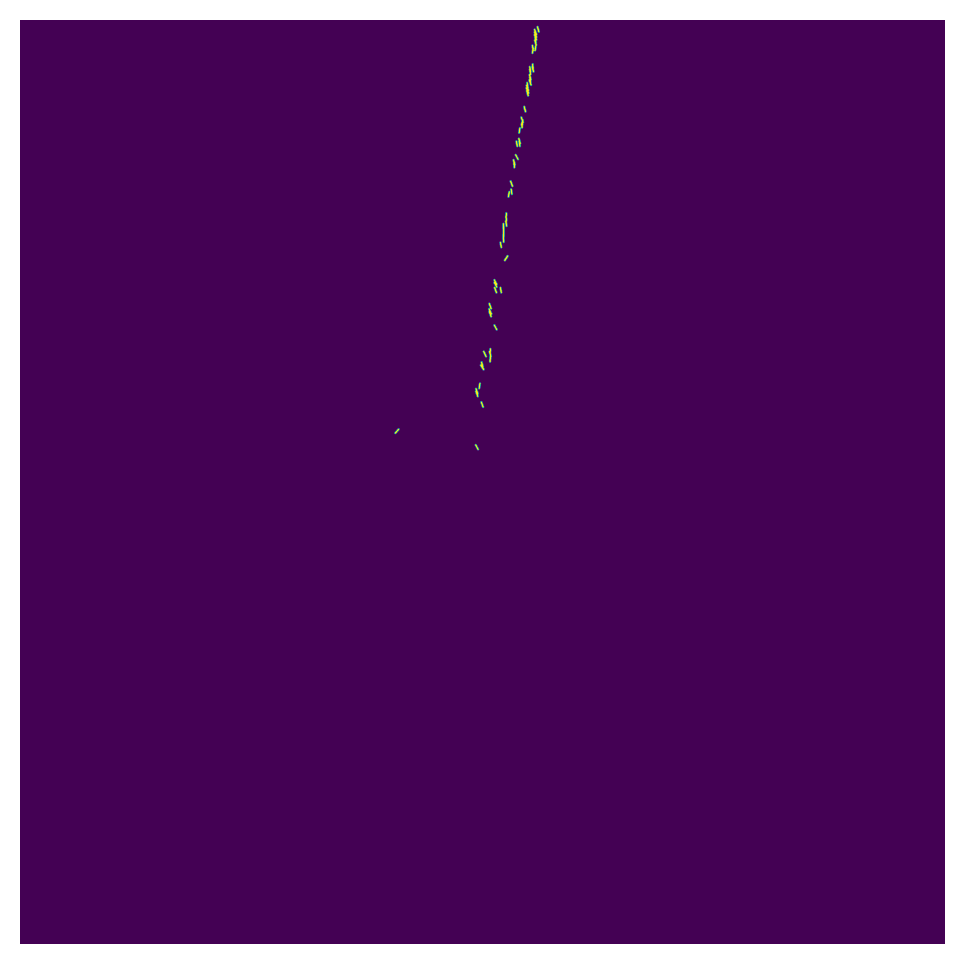

In [49]:
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(ang1_img)
plt.axis('off')
plt.show()

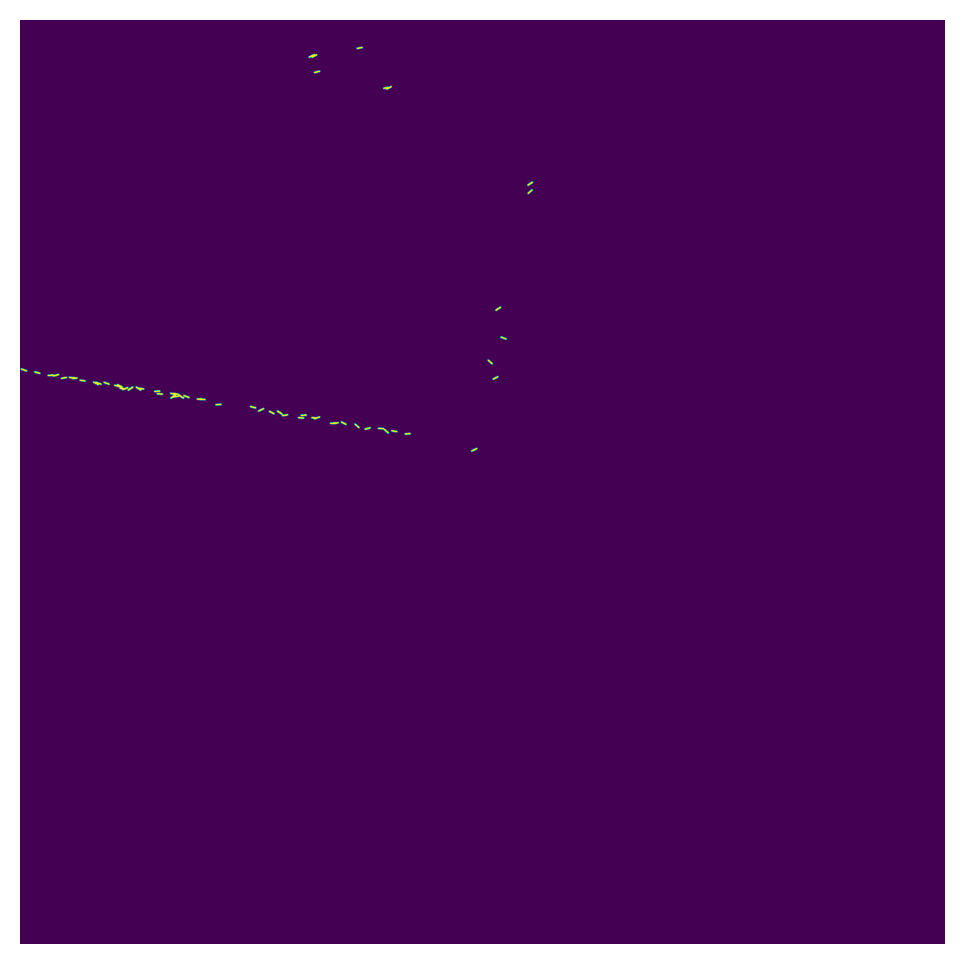

In [50]:
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(ang2_img)
plt.axis('off')
plt.show()

(8821, 2)
8821
sum1_xy:  10944712254
sum1_x:  6160575
sum1_y:  16147192
sum1_xx:  6190445001
sum1_yy:  29630094472
slope1:  -0.1761027970356695 Yint1:  1953.529813949441


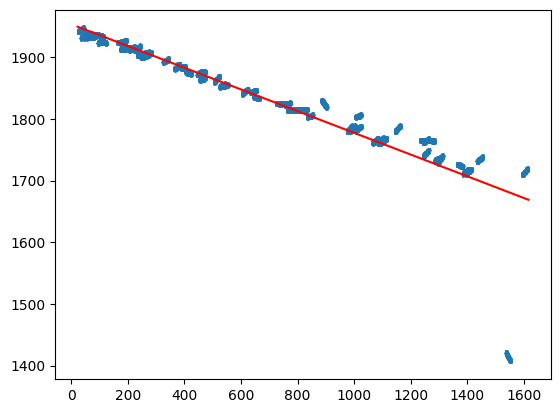

In [51]:
Dots1 = np.argwhere(ang1_img > 0)
print(Dots1.shape)
# print(Dots1)
count1 = len(Dots1)
print(count1)
s1_xy = 0
s1_x = 0
s1_xx = 0
s1_y = 0
s1_yy =0
for line in Dots1:
    s1_xy += line[0]*line[1]
    s1_x += line[0]
    s1_y += line[1]
    s1_xx += line[0]**2
    s1_yy += line[1]**2
print("sum1_xy: ",s1_xy)
print("sum1_x: ",s1_x)
print("sum1_y: ",s1_y)
print("sum1_xx: ",s1_xx)
print("sum1_yy: ",s1_yy)
slope1 = (count1 * s1_xy - s1_x * s1_y) / (count1 * s1_xx - s1_x**2)
Yint1 = (s1_y - slope1 * s1_x) / count1
print("slope1: ",slope1,"Yint1: ",Yint1)
plt.scatter([line[0] for line in Dots1], [line[1] for line in Dots1], s=1)
x1_min = min([line[0] for line in Dots1])
x1_max = max([line[0] for line in Dots1])
y1_min = Yint1 + slope1 * x1_min
y1_max = Yint1 + slope1 * x1_max
plt.plot([x1_min,x1_max],[y1_min,y1_max],color='red')



        

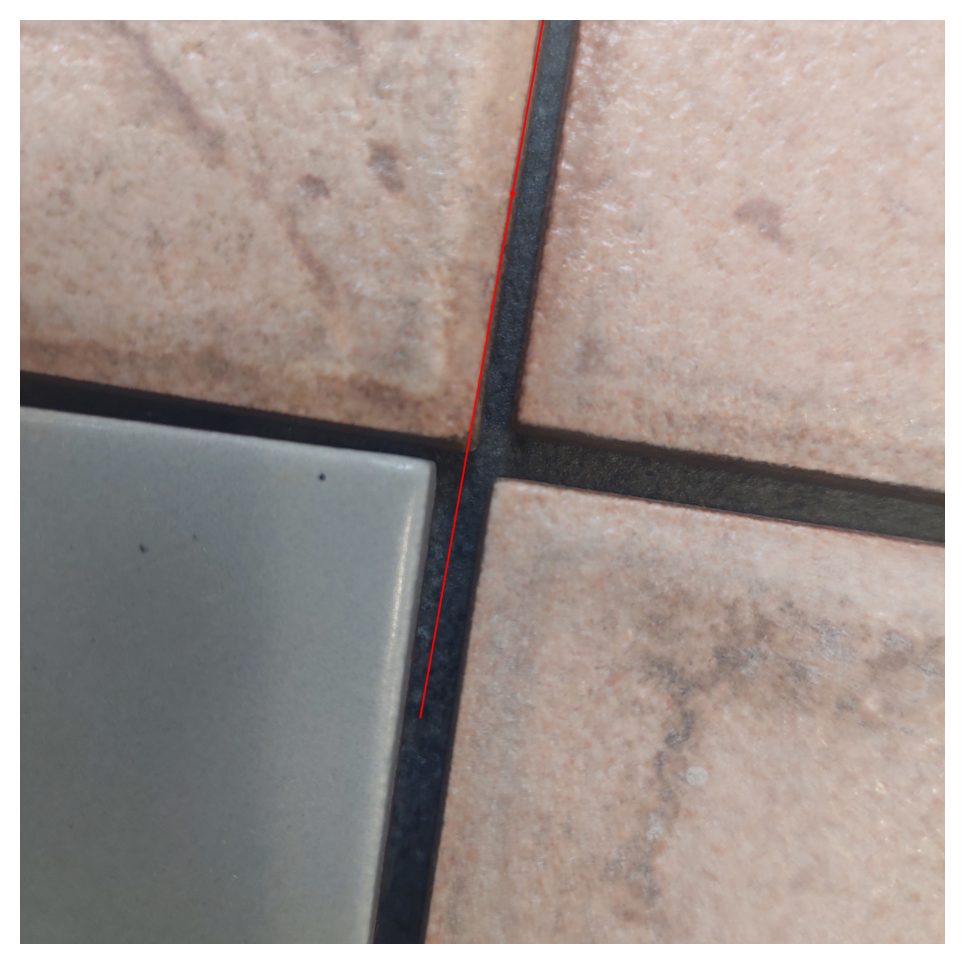

In [52]:
cords_init = np.argwhere(ang1_img > 0)[len(np.argwhere(ang1_img > 0))//2]
temp_out = input_img.copy()
temp_out = cv2.circle(temp_out, (cords_init[1], cords_init[0]), 10, (255,0,0), -1)
cv_slope1 = slope1
c2_x = int(cords_init[1] + 2000*np.sin(atan(cv_slope1)))
c2_y = int(cords_init[0] + 2000*np.cos(atan(cv_slope1)))
c3_x = int(cords_init[1] - 2000*np.sin(atan(cv_slope1)))
c3_y = int(cords_init[0] - 2000*np.cos(atan(cv_slope1)))
temp_out = cv2.line(temp_out, (c2_x, c2_y), (c3_x, c3_y), (255,0,0), 5)
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(temp_out)
plt.axis('off')
plt.show()




(9233, 2)
9233
sum1_xy:  9848464545
sum1_x:  11671915
sum1_y:  8220174
sum1_xx:  16231015929
sum1_yy:  9983955268
slope1:  -0.3679579373652042 Yint1:  1355.4584391315918


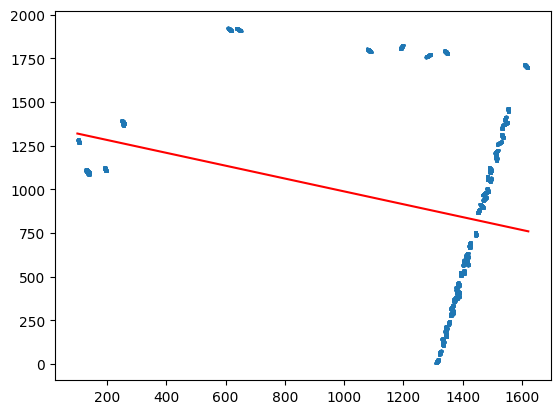

In [53]:

Dots2 = np.argwhere(ang2_img > 0)
print(Dots2.shape)
# print(Dots1)
count2 = len(Dots2)
print(count2)
s2_xy = 0
s2_x = 0
s2_xx = 0
s2_y = 0
s2_yy =0
for line in Dots2:
    s2_xy += line[0]*line[1]
    s2_x += line[0]
    s2_y += line[1]
    s2_xx += line[0]**2
    s2_yy += line[1]**2
print("sum1_xy: ",s2_xy)
print("sum1_x: ",s2_x)
print("sum1_y: ",s2_y)
print("sum1_xx: ",s2_xx)
print("sum1_yy: ",s2_yy)
slope2 = (count2 * s2_xy - s2_x * s2_y) / (count2 * s2_xx - s2_x**2)
Yint2 = (s2_y - slope2 * s2_x) / count2
print("slope1: ",slope2,"Yint1: ",Yint2)
plt.scatter([line[0] for line in Dots2], [line[1] for line in Dots2], s=1)
x2_min = min([line[0] for line in Dots2])
x2_max = max([line[0] for line in Dots2])
y2_min = Yint2 + slope2 * x2_min
y2_max = Yint2 + slope2 * x2_max
plt.plot([x2_min,x2_max],[y2_min,y2_max],color='red')


9233


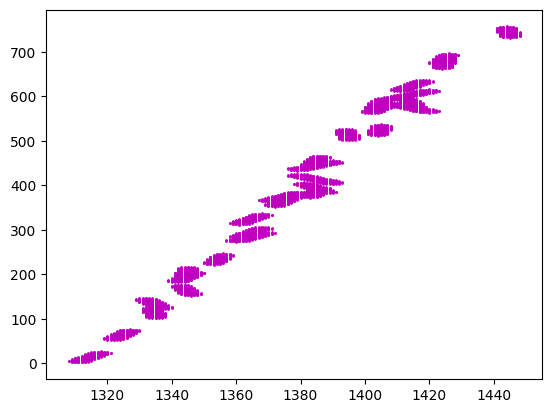

In [67]:
from scipy.spatial import cKDTree
kmeans_lin = KMeans(n_clusters=2)

print(len(Dots2))
tree = cKDTree(Dots2)

visited = set()
components = []

for i, point in enumerate(Dots2):
    if i not in visited:
        component = set()
        stack = [i]

        while stack:
            current = stack.pop()
            if current not in visited:
                visited.add(current)
                component.add(current)
                neighbors = tree.query_ball_point(Dots2[current], 100)
                stack.extend(neighbors)

        components.append(list(component))

components.sort(key=len, reverse=True)
comps = np.array(Dots2[components[0]])
plt.scatter(comps[:,0],comps[:,1],s=1,c='m')







(4293, 2)
4293
sum1_xy:  2344620741
sum1_x:  5919581
sum1_y:  1679510
sum1_xx:  8167339643
sum1_yy:  829771030
slope1:  5.893179526714773 Yint1:  -7734.834278110823


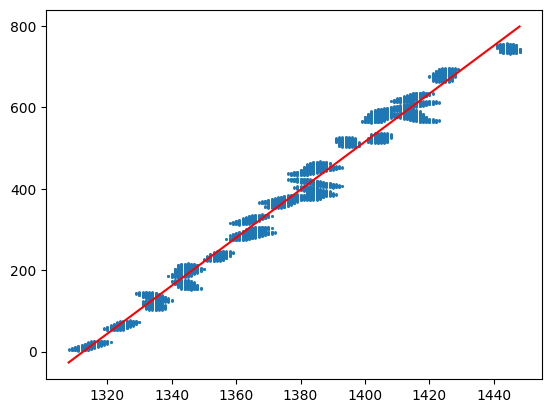

In [69]:
print(comps.shape)
# print(Dots1)
count2 = len(comps)
print(count2)
s2_xy = 0
s2_x = 0
s2_xx = 0
s2_y = 0
s2_yy =0
for line in comps:
    s2_xy += line[0]*line[1]
    s2_x += line[0]
    s2_y += line[1]
    s2_xx += line[0]**2
    s2_yy += line[1]**2
print("sum1_xy: ",s2_xy)
print("sum1_x: ",s2_x)
print("sum1_y: ",s2_y)
print("sum1_xx: ",s2_xx)
print("sum1_yy: ",s2_yy)
slope2 = (count2 * s2_xy - s2_x * s2_y) / (count2 * s2_xx - s2_x**2)
Yint2 = (s2_y - slope2 * s2_x) / count2
print("slope1: ",slope2,"Yint1: ",Yint2)
plt.scatter([line[0] for line in comps], [line[1] for line in comps], s=1)
x2_min = min([line[0] for line in comps])
x2_max = max([line[0] for line in comps])
y2_min = Yint2 + slope2 * x2_min
y2_max = Yint2 + slope2 * x2_max
plt.plot([x2_min,x2_max],[y2_min,y2_max],color='red')


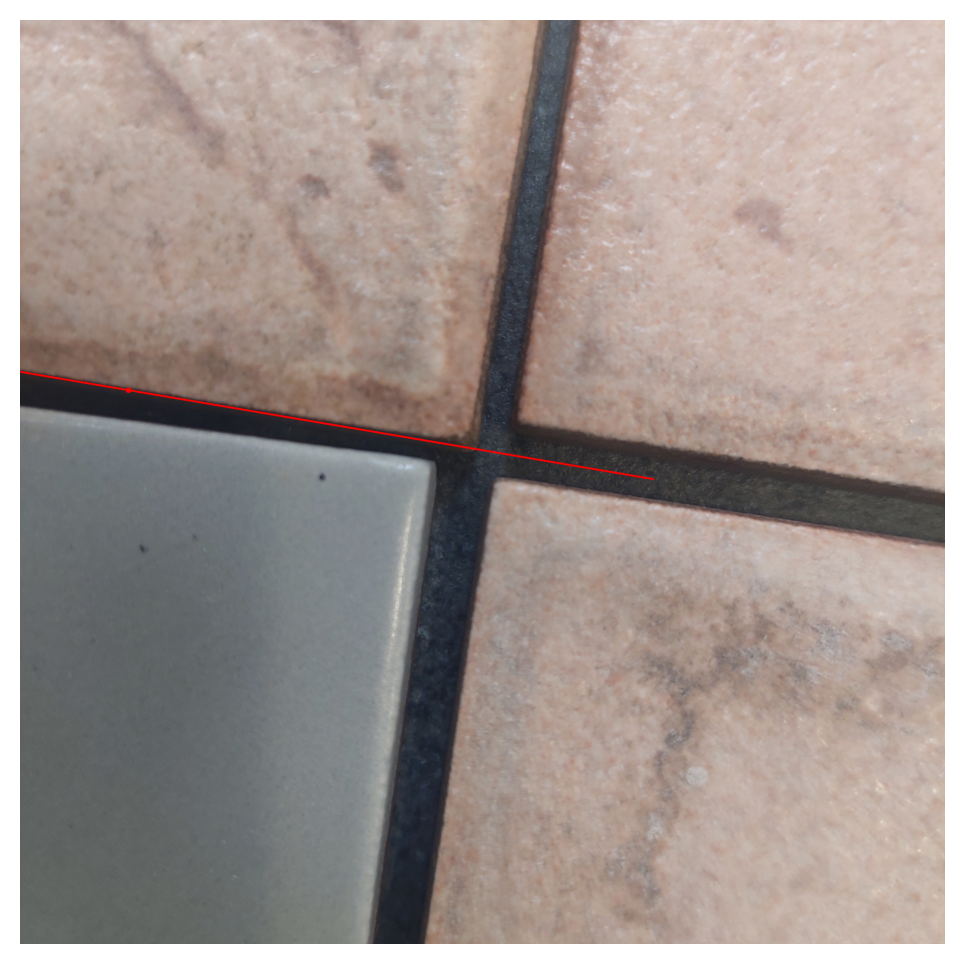

In [70]:
cords_init = np.argwhere(ang2_img > 0)[len(np.argwhere(ang2_img > 0))//2]
temp_out = input_img.copy()
temp_out = cv2.circle(temp_out, (cords_init[1], cords_init[0]), 10, (255,0,0), -1)
cv_slope2 = slope2
c2_x2 = int(cords_init[1] + 2000*np.sin(atan(cv_slope2)))
c2_y2 = int(cords_init[0] + 2000*np.cos(atan(cv_slope2)))
c3_x2 = int(cords_init[1] - 2000*np.sin(atan(cv_slope2)))
c3_y2 = int(cords_init[0] - 2000*np.cos(atan(cv_slope2)))
temp_out = cv2.line(temp_out, (c2_x2, c2_y2), (c3_x2, c3_y2), (255,0,0), 5)
plt.figure(figsize=(12, 6),dpi=200)
plt.imshow(temp_out)
plt.axis('off')
plt.show()